In [2]:
import sys
import os

sys.path.insert(0, os.path.abspath("."))
sys.path.append(os.path.abspath("../"))

In [3]:
import numpy as np
np.set_printoptions(linewidth=np.inf)
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.graph_objects as go
import functools
from scipy.linalg import qr_insert, qr

In [4]:
import desc

from desc.basis import *
from desc.backend import *
from desc.compute import data_index
from desc.coils import SplineXYZCoil
from desc.equilibrium import *
from desc.examples import get
from desc.grid import *
from desc.geometry import *

from desc.objectives import *
from desc.objectives.objective_funs import *
from desc.objectives.getters import *
from desc.objectives.normalization import compute_scaling_factors
from desc.objectives.utils import factorize_linear_constraints
from desc.optimize._constraint_wrappers import *

from desc.transform import Transform
from desc.plotting import *
from desc.optimize import Optimizer
from desc.perturbations import *
from desc.profiles import PowerSeriesProfile

from desc.utils import copy_coeffs, svd_inv_null

from desc.__main__ import main
from desc.vmec_utils import vmec_boundary_subspace
from desc.input_reader import InputReader
from desc.continuation import solve_continuation_automatic

DESC version 0.12.2+468.gff3a0e9fe.dirty,using JAX backend, jax version=0.4.34, jaxlib version=0.4.34, dtype=float64
Using device: CPU, with 11.01 GB available memory


In [5]:
eq = get("ARIES-CS")

In [51]:
fig = go.Figure()
grid = LinearGrid(
    rho=1,
    theta=np.linspace(0, 2 * np.pi, 200),
    zeta=np.linspace(2 * np.pi/eq.NFP, 4 * np.pi/eq.NFP, 200),
    sym=True,
)

plot_3d(eq, "|B|", grid=grid, showgrid=False, showaxislabels=False, showticklabels=False, showscale=False, fig=fig)
plot_3d(eq, "|B|", alpha=0.2, showgrid=False, showaxislabels=False, showticklabels=False, showscale=False, fig=fig)

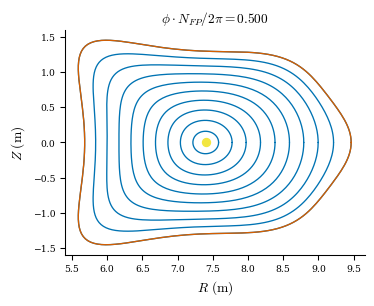

In [17]:
_,_,data = plot_surfaces(eq, rho=10, phi=np.pi/eq.NFP, theta=0, return_data = True)
# plt.savefig("ATF_B_field.png", dpi=300)

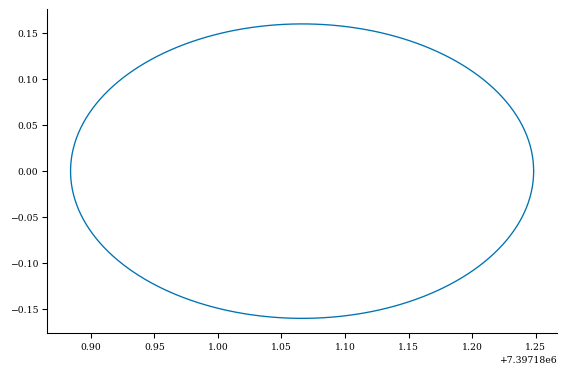

In [35]:
import matplotlib.pyplot as plt
plt.plot(1e6*data["rho_R_coords"][:,0], 1e6*data["rho_Z_coords"][:,0])

In [34]:
data["rho_Z_coords"][:,0].squeeze()

Array([ 3.35199852e-17, -5.62592005e-09, -1.12449090e-08, -1.68500443e-08, -2.24344205e-08, -2.79911575e-08, -3.35134095e-08, -3.89943732e-08, -4.44272960e-08, -4.98054846e-08, -5.51223131e-08, -6.03712311e-08, -6.55457720e-08, -7.06395609e-08, -7.56463221e-08, -8.05598875e-08, -8.53742034e-08, -9.00833387e-08, -9.46814918e-08, -9.91629977e-08, -1.03522335e-07, -1.07754134e-07, -1.11853180e-07, -1.15814423e-07, -1.19632984e-07, -1.23304157e-07, -1.26823420e-07, -1.30186437e-07, -1.33389065e-07, -1.36427359e-07, -1.39297574e-07, -1.41996176e-07, -1.44519839e-07, -1.46865454e-07, -1.49030131e-07, -1.51011205e-07, -1.52806233e-07, -1.54413004e-07, -1.55829540e-07, -1.57054094e-07, -1.58085158e-07, -1.58921462e-07, -1.59561976e-07, -1.60005909e-07, -1.60252717e-07, -1.60302094e-07, -1.60153979e-07, -1.59808555e-07, -1.59266248e-07, -1.58527726e-07, -1.57593898e-07, -1.56465915e-07, -1.55145167e-07, -1.53633281e-07, -1.51932120e-07, -1.50043778e-07, -1.47970584e-07, -1.45715090e-07, -1.4328

In [41]:
fig = go.Figure()
res_M = 9
res_N = 5
plot_3d(eq, "|B|", alpha=0.1, fig=fig, showgrid=False, showaxislabels=False, showticklabels=False, showscale=False)
for r in [0.3, 1]:
    grid = LinearGrid(
        rho=r,
        theta=np.linspace(0, 2 * np.pi, 200),
        zeta=np.linspace(0, 2 * np.pi/eq.NFP, 200),
        sym=True,
    )
    grid_points = LinearGrid(
            rho=r,
            theta=np.linspace(0, 2 * np.pi, res_M),
            zeta=np.linspace(0, 2 * np.pi/eq.NFP, res_N),
            NFP=eq.NFP,
            sym=True,
        )
    
    data = eq.compute(["X", "Y", "Z"], grid=grid_points)
    x = data["X"]
    y = data["Y"]
    z = data["Z"]
    alpha = 1 if r==1 else 0.5
    plot_3d(eq, "|B|", grid=grid, alpha=alpha, showgrid=False, showaxislabels=False, showticklabels=False, showscale=False,  fig=fig)
    fig.add_trace(go.Scatter3d(x=x, 
                        y=y, 
                        z=z,
                        mode='markers', 
                        marker=dict(   
                            color='black', 
                            size=10,    
                            opacity=0.8
                            )
                        )
                    )
fig.show()

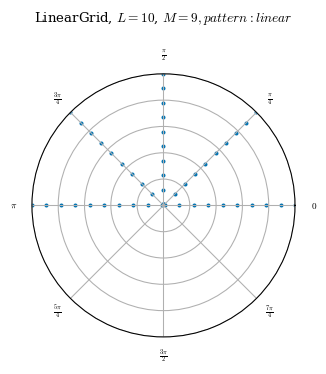

In [49]:
grid_points = LinearGrid(
            rho=np.linspace(0.01, 1, 10),
            theta=np.linspace(0, 2 * np.pi, 9),
            zeta=np.linspace(0, 2 * np.pi/eq.NFP, res_N),
            NFP=eq.NFP,
            sym=True,
        )
plot_grid(grid_points);
plt.savefig("gridpoints.png", dpi=300)